# **Лабораторная работа**
*Naumov Anton (Any0019)*

*To contact me in telegram: @any0019*

В данном задании вашей задачей будет построить и обучить модель CycleGAN для задачи Img2Img.

---

Про задачу __Img2Img__:

- У вас есть 2 множества изображений ($A$ и $B$)
- Ваша задача - научиться превращать изображения из множества $A$ в изображения из множества $B$ и наоборот
- Бывают paired и unpaired множества
- В случае __paired__ множеств - для каждого изображения из $A$ существует конкретное изображение из $B$, в которое оно должно перейти (и наоборот). Примером такой пары множеств может быть (а) спутниковая фотграфия местности vs схематическая карта местности , (б) фотография фасада здания vs схема фасада здания , ...
- В случае __unpaired__ множеств - между множествами нет конкретных пар. Примером такой пары множеств может быть (а) фотографии с лошадьми vs фотографии с зебрами , (б) фотографии vs рисунки конкретного художника , ...

---

Про модель __CycleGAN__:

- Модель придумана для задачи Img2Img (в первую очередь unpaired версии) и основана на концепции GAN-ов
- В модели есть 2 генератора: $G_{A -> B}$ (задача которого - принимая на вход изображение из множества $A$ переводить его в изображение из множества $B$) и $G_{B -> A}$ (аналогично в другую сторону)
- Надо отметить что на вход генераторы не получают никакую дополнительную случайность, что делает обучение таких моделей проще
- В модели так же есть 2 дискриминатора: $D_{A}$ (задача которого - отличать реальные изображения из $A$ от сгенерированных с помощью $G_{B -> A}$ изображений) и $D_{B}$ (аналогично для $B$)
- Функцией ошибки будет, как и для GAN-ов, minmax игра между генераторами и дискриминаторами, но к ошибке генераторов добавится ещё и, так называемый, `cycle consistency loss`, который проверяет, что после двойного перехода изображения не меняются $G_{B -> A} \big( G_{A -> B} ( a ) \big) = a ; \forall a \in A$ и $G_{A -> B} \big( G_{B -> A} ( b ) \big) = b ; \forall b \in B$
- Так же можно добавлять или нет штраф за то, чтобы $G_{B -> A}$ не меняла изображения из $A$ и наоборот $G_{A -> B}$ не меняла изображения из $B$
- Оригинальная статья: https://arxiv.org/pdf/1703.10593.pdf

---

Ваша задача - ноутбук разбит на несколько частей, каждая со своими баллами

1. __Подготовка данных__ _(2 балла)_ --> требуется выбрать датасет для обучения (дано несколько на выбор) и составить пайплайн подготовки данных
2. __Составление модели__ _(6 баллов)_ --> требуется собрать нейросеть _(3 балла)_ и создать функции ошибки _(3 балла)_
3. __Подготовка обучения__ _(2 балла)_ --> требуется написать шаги обучения и валидации, визуализацию, а так же полный цикл обучения
4. __Обучение__ _(2 балла)_ --> требуется обучить модель
5. __Сбор своего датасета и обучение модели на нём__ _(3 балла)_ --> требуется собрать свой датасет и обучить на нём модель

***За наиболее интересные и качественные решения в пункте 5 так же предусмотрены дополнительные баллы***

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader

from torchvision import datasets, transforms as tr

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

# Для тёмной темы jupyter - уберите если не нужно
plt.style.use('dark_background')

from tqdm.auto import tqdm, trange

import os
import sys
import requests
import cv2

from dataclasses import dataclass

# 1. Подготовка данных (___2 балла___)

## 1.1 Выбор и скачивание датасета

In [3]:
import os
from torchvision import datasets
import matplotlib.pyplot as plt

dataset_folder = "datasets/img2img"
num_images_per_split = 5



In [4]:
'''
!mkdir -p {dataset_folder}

# В этом цикле каждый из предложенных датасетов
#  - скачивается
#  - распаковывается
#  - отрисовывается + meta
#  - удаляется

# Предлагается посмотреть на все предложенные варианты датасетов и затем оставить один,
#  с которым захочется работать больше всего - закомментируйте (или удалите) все, кроме
#  выбранного, а так же закомментируйте строчки с удалением скачанного датасета

for dataset_name in [
    # Uncomment the dataset you want:
    #"apple2orange",
    "summer2winter_yosemite",
    "horse2zebra",
    "monet2photo",
    "cezanne2photo",
    "ukiyoe2photo",
    "vangogh2photo",
    "maps",
    "facades",
]:
    print(os.listdir(dataset_folder))
    
    print(f"Dataset '{dataset_name}'")
    url = f"http://efrosgans.eecs.berkeley.edu/cyclegan/datasets/{dataset_name}.zip"
    download_path = os.path.join(dataset_folder, f"{dataset_name}.zip")
    target_folder = os.path.join(dataset_folder, dataset_name)
    
    print("Loading zip file...", end="")
    # Проверяем что нет такого загруженого файла
    if not os.path.isfile(download_path):      
        # # Можно загрузить через requests библиотеку
        # response = requests.get(url)
        # open(download_path, "wb").write(response.content)
        
        # Можно загрузить через wget
        !wget {url} -O {download_path}
    print(" --> done!")
        
    print("Unzipping...", end="")
    if os.path.exists(target_folder):
        !rm -r {target_folder}
    !mkdir -p {dataset_folder}
    !unzip -qq {download_path} -d {dataset_folder}
    print(" --> done!")

    
     # Meta + Отрисовка
    print(f"Provided splits: {os.listdir(target_folder)}")
    
    # Удобный способ быстро получить датасет картинок с лэйблами, если картинки разложены по папкам в формате:
    # root_folder/label_name/img.jpg
    # (в нашем случае нет лэйблов, но картинки разложены в таком же формате, просто вместо label_name идёт
    #  split_name: trainA/testA/trainB/testB)
    dataset = datasets.ImageFolder(target_folder)
    inds_to_show = {i: [] for i, _ in enumerate(dataset.classes)}
    classes_full = 0
    for dataset_ind in range(len(dataset)):
        _, split_ind = dataset[dataset_ind]
        if len(inds_to_show[split_ind]) == num_images_per_split:
            continue
        inds_to_show[split_ind].append(dataset_ind)
        if len(inds_to_show[split_ind]) == num_images_per_split:
            classes_full += 1
        if classes_full == len(dataset.classes):
            break

    for split_name in sorted(dataset.classes):
        split_ind = dataset.class_to_idx[split_name]
        print(f"Split '{split_name}' of dataset '{dataset_name}'", end="")
        split_folder = os.path.join(target_folder, split_name)
        print(f" --> size: {len(os.listdir(split_folder))}")

        plt.subplots(1, num_images_per_split, figsize=(5 * num_images_per_split, 5))
        plt.suptitle(f"{dataset_name} ~ {split_name}", y=0.95)
        for i, dataset_ind in enumerate(inds_to_show[split_ind]):
            plt.subplot(1, num_images_per_split, i + 1)
            plt.imshow(dataset[dataset_ind][0])
            plt.xticks([])
            plt.yticks([])
        plt.show()
    
    # Удаляем скачанный датасет
    # !rm -r {target_folder}
    
    print("\n----------------------------\n")
'''
print('Done!')

Done!


## 1.2 Dataset и Transforms

В папке `target_folder` находятся несколько папок со сплитами для соответствующего датасета, в каждой папке сплита находятся сами `.jpg` изображения.

Давайте составим их в удобном для нас виде в отдельные датасеты для каждого сплита без лэйблов.

Для получения картинок можно использовать 
```python
cv2.imread(img_path)[:, :, ::-1]  # каналы записаны в обратном порядке
```

In [129]:
# Выбранный выше и скачанный датасет
dataset_folder = "datasets/img2img"
dataset_name = "monet2photo"
target_folder = os.path.join(dataset_folder, dataset_name)

# Класс для датасета изображений без лэйблов с применением трансформов
class ImageDatasetNoLabel(Dataset):
    def __init__(self, folder_path, transform=None):
        super().__init__()
        self.folder_path = folder_path
        self.image_files = sorted([
            os.path.join(folder_path, fname)
            for fname in os.listdir(folder_path)
            if fname.lower().endswith('.jpg')
        ])
        self.transform = transform

    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, index):
        img_path = self.image_files[index]
        img = cv2.imread(img_path)[:, :, ::-1]
        if self.transform:
            img = self.transform(img)
        return img



# Удобный класс для хранения всех наших датасетов
@dataclass
class DatasetsClass:
    train_a: ImageDatasetNoLabel
    train_b: ImageDatasetNoLabel
    test_a: ImageDatasetNoLabel
    test_b: ImageDatasetNoLabel


# Все датасеты без трансформов - чтобы посчитать статистики
ds = DatasetsClass(
    train_a=ImageDatasetNoLabel(os.path.join(target_folder, "trainA")),
    train_b=ImageDatasetNoLabel(os.path.join(target_folder, "trainB")),
    test_a=ImageDatasetNoLabel(os.path.join(target_folder, "testA")),
    test_b=ImageDatasetNoLabel(os.path.join(target_folder, "testB")),
)

In [130]:
def get_channel_statistics(dataset):
    """
    Функция для получения поканальных статистик (среднее и отклонение) по датасету
    """
    dataset = list(map(lambda img: img / 255, dataset))
    channel_mean = np.mean(dataset, axis=(0, 1, 2))
    channel_std = np.std(dataset, axis=(0, 1, 2))
    return channel_mean, channel_std


# Поканальное среднее и отклонение для A
channel_mean_a, channel_std_a = np.array([0.51991925, 0.51146052, 0.47215716]), \
                                np.array([0.22557716, 0.21753682, 0.24335829]) #get_channel_statistics(ds.train_a)
#print(channel_mean_a, channel_std_a)

# Поканальное среднее и отклонение для B
channel_mean_b, channel_std_b = np.array([0.41229027, 0.40928956, 0.39267376]), \
                                np.array([0.27109754, 0.24869304, 0.27782148]) #get_channel_statistics(ds.train_b)
#print(channel_mean_b, channel_std_b)




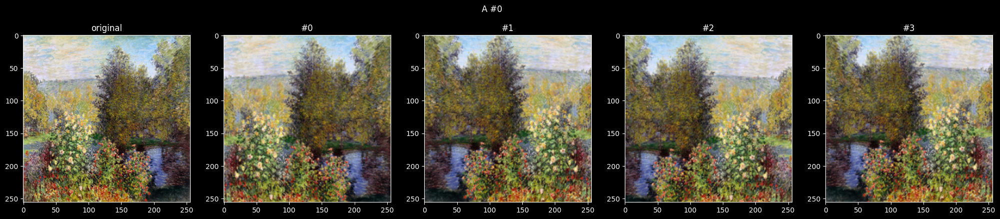

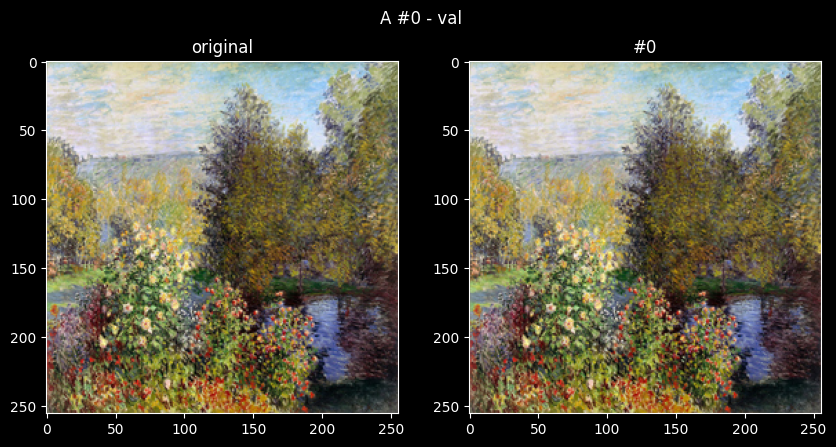

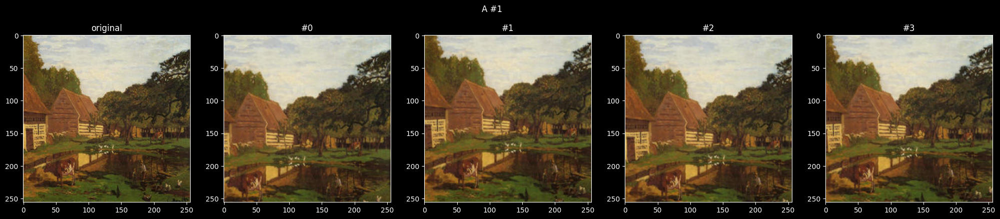

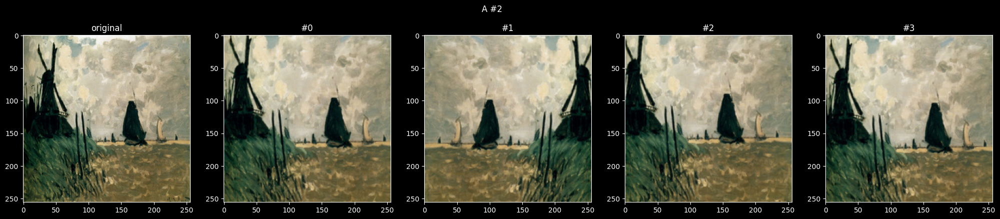

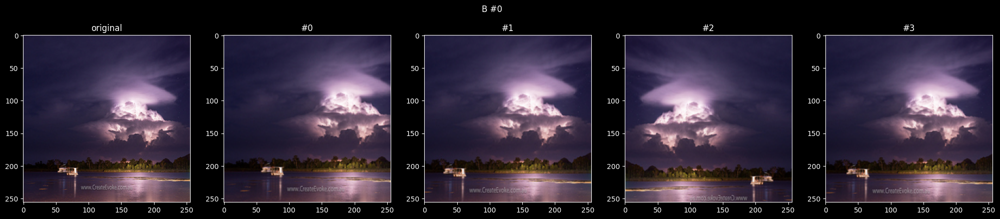

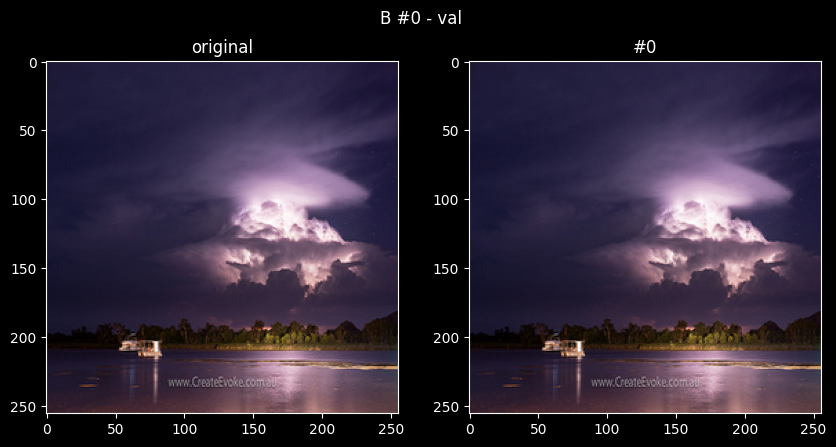

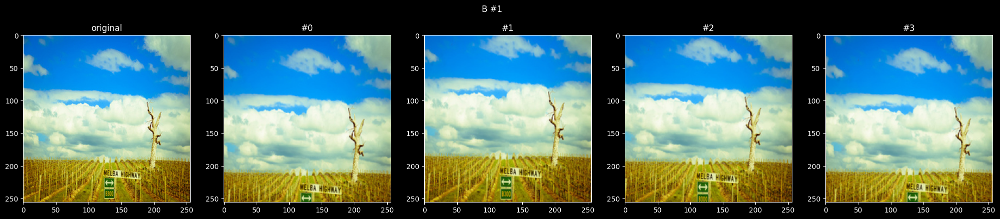

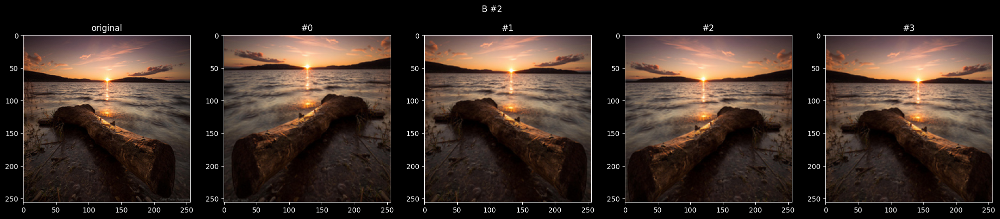

In [133]:
# Функция для получения train и val transform-ов, а так же функции для де-нормализации изображения
'''
def get_transforms(mean, std, image_size=256, augmentation_prob=0.5):
    train_transform = tr.Compose([
        tr.ToPILImage(),
        tr.Resize((286, 286)),
        tr.RandomCrop((image_size, image_size)),
        tr.RandomHorizontalFlip(p=augmentation_prob),
        tr.transforms.ToTensor(),
        tr.transforms.Normalize(mean, std)
    ])
    val_transform = tr.Compose([
        tr.ToPILImage(),
        tr.Resize((image_size, image_size)),
        tr.transforms.ToTensor(),
        tr.transforms.Normalize(mean, std)
    ])

    def de_normalize(tensor, mean=mean, std=std):
        tensor = tensor.clone()
        tensor = tensor * std[:, None, None] + mean[:, None, None]
        image = tensor.clamp(0, 1).permute(1, 2, 0).detach().numpy()
        return image
    
    return train_transform, val_transform, de_normalize
'''
def get_transforms(mean, std, image_size=256, augmentation_prob=0.5):
    train_transform = tr.Compose([
        tr.ToPILImage(),
        tr.Resize((286, 286)),
        tr.RandomCrop((image_size, image_size)),
        tr.RandomHorizontalFlip(p=augmentation_prob),
        tr.ToTensor(),
        tr.Normalize(mean, std)
    ])
    val_transform = tr.Compose([
        tr.ToPILImage(),
        tr.Resize((image_size, image_size)),
        tr.ToTensor(),
        tr.Normalize(mean, std)
    ])
    
    def de_normalize(tensor):
        tensor = tensor.clone().cpu()
        mean_tensor = torch.tensor(mean).view(-1, 1, 1)
        std_tensor = torch.tensor(std).view(-1, 1, 1)
        tensor = tensor * std_tensor + mean_tensor
        image = tensor.clamp(0, 1).permute(1, 2, 0).numpy()
        return image

    return train_transform, val_transform, de_normalize

# Ваши гиперпараметры
hyperparams = dict(
    image_size=256,
    augmentation_prob=0.5
)


# transform-ы для A и B
train_transform_a, val_transform_a, de_normalize_a = get_transforms(channel_mean_a, channel_std_a, **hyperparams)
train_transform_b, val_transform_b, de_normalize_b = get_transforms(channel_mean_b, channel_std_b, **hyperparams)


# Функция для визуализации transform-ов
def show_examples(dataset, transform, de_norm, num_per_image=3, image_index=0, title=""):
    fig, ax = plt.subplots(1, 1 + num_per_image, figsize=(5 * (1 + num_per_image), 5))
    
    image = dataset[image_index]
    
    plt.suptitle(title, y=0.95)

    plt.subplot(1, 1 + num_per_image, 1)
    plt.imshow(image)
    plt.title("original")

    for i in range(num_per_image):
        plt.subplot(1, 1 + num_per_image, i + 2)
        plt.title(f"#{i}")
        plt.imshow(de_norm(transform(image)))
    plt.show()

# Проверка на адекватность
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=0, title="A #0")
show_examples(ds.train_a, val_transform_a, de_normalize_a, num_per_image=1, image_index=0, title="A #0 - val")
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=1, title="A #1")
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=2, title="A #2")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=0, title="B #0")
show_examples(ds.train_b, val_transform_b, de_normalize_b, num_per_image=1, image_index=0, title="B #0 - val")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=1, title="B #1")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=2, title="B #2")

In [139]:
# Все датасеты с трансформами
ds = DatasetsClass(
    train_a=ImageDatasetNoLabel(
        os.path.join(target_folder, "trainA"),
        transform=train_transform_a,
    ),
    train_b=ImageDatasetNoLabel(
        os.path.join(target_folder, "trainB"),
        transform=val_transform_b,
    ),
    test_a=ImageDatasetNoLabel(
        os.path.join(target_folder, "testA"),
        transform=val_transform_a,
    ),
    test_b=ImageDatasetNoLabel(
        os.path.join(target_folder, "testB"),
        transform=val_transform_b,
    ),
)

## 1.3 DataLoader

In [140]:
@dataclass
class DataLoadersClass:
    train_a: DataLoader
    train_b: DataLoader
    test_a: DataLoader
    test_b: DataLoader

batch_size = 8 #16 #32

dataloaders = DataLoadersClass(
    train_a=DataLoader(
        dataset=ds.train_a,
        batch_size=batch_size,
        shuffle=True,
        drop_last=True,
    ),
    train_b=DataLoader(
        dataset=ds.train_b,
        batch_size=batch_size,
        shuffle=True,
        drop_last=True,
    ),
    test_a=DataLoader(
        dataset=ds.test_a,
        batch_size=batch_size,
        shuffle=False,
        drop_last=True,
    ),
    test_b=DataLoader(
        dataset=ds.test_b,
        batch_size=batch_size,
        shuffle=False,
        drop_last=True,
    ),
)

# 2. Модель (___6 баллов___)

## 2.0 Любые вспомогательные модули и классы

In [145]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, channels):
        super().__init__()
        self.block = nn.Sequential(
                nn.Conv2d(in_channels,channels,kernel_size = (3, 3), padding = 1, padding_mode = 'reflect'),
                #nn.BatchNorm2d(channels),
                nn.InstanceNorm2d(channels),
                nn.ReLU(), #inplace=True
                nn.Conv2d(channels,channels,kernel_size = (3, 3), padding = 1, padding_mode = 'reflect'),
                #nn.BatchNorm2d(channels))
                nn.InstanceNorm2d(channels))

    def forward(self, x):
        c = self.block(x)
        out = torch.cat((c, x), axis = 1)
        return out

class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv_blocks = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size = (7, 7), padding = 3, padding_mode = 'reflect'),
            nn.InstanceNorm2d(64),
            #nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size = (3, 3), stride = 2, padding = 1, padding_mode = 'reflect'),
            nn.InstanceNorm2d(128),
            #nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size = (3, 3), stride = 2, padding = 1, padding_mode = 'reflect'),
            nn.InstanceNorm2d(256),
            #nn.BatchNorm2d(256),
            nn.ReLU())

        self.resnet_blocks = nn.Sequential(
            ResidualBlock(256, 256),
            ResidualBlock(512, 256),
            ResidualBlock(768, 256),
            ResidualBlock(1024, 256),
            ResidualBlock(1280, 256),
            ResidualBlock(1536, 256),
            ResidualBlock(1792, 256),
            ResidualBlock(2048, 256),
            ResidualBlock(2304, 256))
        
        self.deconv_blocks = nn.Sequential(
            nn.Upsample(scale_factor=4, mode='nearest'),
            nn.Conv2d(2560, 128, kernel_size = (3, 3), stride = 2, padding = 1), #, output_padding = 1
            #nn.ConvTranspose2d(2560, 128, kernel_size = (3, 3), stride = 2, padding = 1, output_padding = 1),
            nn.InstanceNorm2d(128),
            nn.ReLU(),
            nn.Upsample(scale_factor=4, mode='nearest'),
            nn.Conv2d(128, 64, kernel_size = (3, 3), stride = 2, padding = 1), #, output_padding = 1
            #nn.ConvTranspose2d(128, 64, kernel_size = (3, 3), stride = 2, padding = 1, output_padding = 1),
            nn.InstanceNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 3, kernel_size = (7, 7), padding = 3, padding_mode = 'reflect'),
            nn.InstanceNorm2d(3),
            nn.Tanh()) 

    

    def forward(self, x):
        x = self.conv_blocks(x)
        x = self.resnet_blocks(x)
        out = self.deconv_blocks(x)
        #print(out.shape)
        return out
    


class Discriminator(nn.Module):
    def __init__(self, in_channels=3):
        super().__init__()
        self.conv_block_1 = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size = (4, 4), stride = 2, padding = 1),
            nn.LeakyReLU(negative_slope = 0.2)
        )
    
        self.conv_blocks = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size = (4, 4), stride = 2, padding = 1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size = (4, 4), stride = 2, padding = 1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2),    
            nn.ZeroPad2d(1),      
            nn.Conv2d(256, 512, kernel_size = (4, 4), stride = 1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2)            
        )
    
        self.conv_block_last = nn.Sequential(
            nn.ZeroPad2d(1),
            nn.Conv2d(512, 1, kernel_size = (4, 4), stride = 1),
            nn.Sigmoid())
    
    def forward(self, x):
        x = self.conv_block_1(x)
        x = self.conv_blocks(x)
        out = self.conv_block_last(x) 
        
        return out



## 2.1 Архитектура сети (___3 балла___)

In [11]:

class CycleGAN(nn.Module):
    def __init__(self, generator_AB, generator_BA, discriminator_A, discriminator_B):
        super(CycleGAN, self).__init__()
        self.generator_AB = generator_AB
        self.generator_BA = generator_BA        
        self.discriminator_A = discriminator_A
        self.discriminator_B = discriminator_B

    def forward(self, image_A, image_B):

        fake_image_B = model.generator_AB(image_A)
        rec_image_A = model.generator_BA(fake_image_B)
        fake_image_A = model.generator_BA(image_B)
        rec_image_B = model.generator_AB(fake_image_A)       
        
        return fake_image_B, rec_image_A, fake_image_A, rec_image_B

## 2.2 Loss (___3 балла___)

$$ \mathbf{L}_{\text{cyc}} \big( G_{A \rightarrow B}, G_{B \rightarrow A} \big) = \mathbb{E}_{a \sim A} \bigg( \Big\| G_{B \rightarrow A} \big( G_{A \rightarrow B} ( a ) \big) - a \Big\|_1 \bigg) + \mathbb{E}_{b \sim B} \bigg( \Big\| G_{A \rightarrow B} \big( G_{B \rightarrow A} ( b ) \big) - b \Big\|_1 \bigg) \longrightarrow \min_{G}$$

In [12]:
class CycleConsistencyLoss(nn.Module):
    """
    Функция ошибки, проверяющая что после двойного перехода через генераторы изображение не изменилось
    """
    def __init__(self):
        super(CycleConsistencyLoss, self).__init__()
        self.l1 = nn.L1Loss()
    
    def forward(self, x, x_rec):
        # Принимает на вход оригинальное изображение и изображение после двойного перехода
        return self.l1(x_rec, x)   

$$ \mathbf{L}_{\text{GAN}} \big( G_{A \rightarrow B}, D_{B} \big) = \mathbb{E}_{b \sim B} \log D_{B} (b) + \mathbb{E}_{a \sim A} \log \Big( 1 - D_{B} \big( G_{A \rightarrow B} (a) \big) \Big) \longrightarrow \min_{G} \max_{D}$$

In [13]:
class AdversarialLossCE(nn.Module):
    """
    Стандартная функция ошибки для minmax игры GAN-ов
    """
    def __init__(self):
        super(AdversarialLossCE, self).__init__()
        self.bce = nn.BCEWithLogitsLoss()
    
    def forward(self, real_pred, fake_pred=None):
        # Принимает на вход D_{A}(a) - real_pred и D_{A}(G(b)) - fake_pred или наоборот
        # Может принимать только один аргумент для удобности использования в случае
        #  обучения или генератора, или дискриминатора
        if fake_pred is not None:
            real_loss = self.bce(real_pred, torch.ones_like(real_pred))
            fake_loss = self.bce(fake_pred, torch.zeros_like(fake_pred))
            return (real_loss + fake_loss) 
        else:
            return self.bce(real_pred, torch.ones_like(real_pred))

$$ \mathbb{E}_{b \sim B} \big( D_{B} (b) - 1 \big)^2 + \mathbb{E}_{a \sim A} \Big( D_{B} \big( G_{A \rightarrow B} (a) \big) \Big)^2 \longrightarrow \min_{D} $$
$$ \mathbb{E}_{a \sim A} \Big( D_{B} \big( G_{A \rightarrow B} (a) \big) - 1 \Big)^2 \longrightarrow \min_{G} $$

In [14]:
class AdversarialLossMSE(nn.Module):
    """
    Можно переписать не через CE, а через MSE loss на одном предсказании, помогает со стабильностью
    """
    def __init__(self):
        super(AdversarialLossMSE, self).__init__()
        self.mse = nn.MSELoss()
    
    def forward(self, real_pred, fake_pred=None):
        # Принимает на вход D_{A}(a) - real_pred и D_{A}(G(b)) - fake_pred или наоборот
        # Может принимать только один аргумент для удобности использования в случае
        #  обучения или генератора, или дискриминатора
        if fake_pred is not None:
            real_loss = self.mse(real_pred, torch.ones_like(real_pred))
            fake_loss = self.mse(fake_pred, torch.zeros_like(fake_pred))
            return real_loss + fake_loss
        else:
            return self.mse(real_pred, torch.ones_like(real_pred))

$$ \mathbf{L} \big( G_{A \rightarrow B}, G_{B \rightarrow A}, D_{A}, D_{B} \big) = \mathbf{L}_{\text{GAN}} \big( G_{A \rightarrow B}, D_{B} \big) + \mathbf{L}_{\text{GAN}} \big( G_{B \rightarrow A}, D_{A} \big) + \lambda \cdot \mathbf{L}_{\text{cyc}} \big( G_{A \rightarrow B}, G_{B \rightarrow A} \big) \longrightarrow \min_{G} \max_{D}$$

In [15]:
class FullDiscriminatorLoss(nn.Module):
    """
    Полная ошибка для дискриминатора
    """
    def __init__(self, is_mse=True):
        super(FullDiscriminatorLoss, self).__init__()
        self.adversarial_loss = AdversarialLossMSE() if is_mse else AdversarialLossCE()
    
    def forward(self, real_pred, fake_pred):
        return self.adversarial_loss(real_pred, fake_pred)

In [16]:
import torch.nn.functional as F

class FullGeneratorLoss(nn.Module):
    """
    Полная ошибка для генератора
    """
    def __init__(self, lambda_advA = 1., lambda_advB = 1., lambda_cycleA=1., lambda_cycleB=1., lambda_contA = 1., lambda_contB = 1., is_mse=True):
        super(FullGeneratorLoss, self).__init__()
        self.adversarial_loss = AdversarialLossMSE() if is_mse else AdversarialLossCE()
        self.cycle_loss = CycleConsistencyLoss()
        self.lambda_advA = lambda_advA
        self.lambda_advB = lambda_advB
        self.lambda_cycleA = lambda_cycleA
        self.lambda_cycleB = lambda_cycleB
        self.lambda_contentA = lambda_contA
        self.lambda_contentB = lambda_contB
        self.l1 = nn.L1Loss()
    
    def forward(self, image_A, image_B, fake_image_A, fake_image_B, rec_image_A, rec_image_B, real_disc_A, real_disc_B, fake_disc_A, fake_disc_B):
        
        loss_cycle = self.lambda_cycleA * self.cycle_loss(image_A, rec_image_A) + self.lambda_cycleB * self.cycle_loss(image_B, rec_image_B)
        loss_adversarial = self.lambda_advA * self.adversarial_loss(real_disc_B, fake_disc_B) + self.lambda_advB * self.adversarial_loss(real_disc_A, fake_disc_A) 
        loss_content = self.lambda_contentA * self.l1(image_A, fake_image_A) + self.lambda_contentB * self.l1(image_B, fake_image_B)
        #loss_content = F.l1_loss(image_A, fake_image_A, reduction='none').mean(dim=(0, 2, 3)).mean() + \
        #               F.l1_loss(image_B, fake_image_B, reduction='none').mean(dim=(0, 2, 3)).mean()

        

        return loss_adversarial + loss_cycle + loss_content


# 3. Подготовка обучения (__2 балла__)

## 3.1 Шаг обучения дискриминатора

In [17]:
def train_discriminators(model, opt_d, loader_a, loader_b, criterion_d, device):
    #model.train()
    model.discriminator_A.train()
    model.discriminator_B.train()
    model.generator_AB.eval()
    model.generator_BA.eval()
    losses_tr = []
    
    iter_a = iter(loader_a)
    iter_b = iter(loader_b)
    batches_per_epoch = min(len(iter_a), len(iter_b))
    
    for _ in trange(batches_per_epoch):
        image_A = next(iter_a).to(device)
        image_B = next(iter_b).to(device)
        
        opt_d.zero_grad()

        #for param in model.features.parameters():
        #    param.requires_grad = False
        with torch.no_grad():
            fake_image_B = model.generator_AB(image_A)
            fake_image_A = model.generator_BA(image_B)
        #print(fake_image_B.shape, fake_image_A.shape)
        
        real_disc_A = model.discriminator_A(image_A)
        fake_disc_A = model.discriminator_A(fake_image_A)
        real_disc_B = model.discriminator_B(image_B)
        fake_disc_B = model.discriminator_B(fake_image_B)

        
        loss_d_A = criterion_d(real_disc_A, fake_disc_A)
        loss_d_B = criterion_d(real_disc_B, fake_disc_B)
        
        loss = loss_d_A + loss_d_B
        
        loss.backward()
        opt_d.step()
        losses_tr.append(loss.item())
    
    return model, opt_d, np.mean(losses_tr)   

## 3.2 Шаг обучения генератора

In [18]:
def train_generators(model, opt_g, loader_a, loader_b, criterion_g, device):
    #model.train()
    model.generator_AB.train()
    model.generator_BA.train()   
    model.discriminator_A.eval()
    model.discriminator_B.eval()
 
    losses_tr = []
    
    iter_a = iter(loader_a)
    iter_b = iter(loader_b)
    batches_per_epoch = min(len(iter_a), len(iter_b))
    
    for _ in trange(batches_per_epoch):
        image_A = next(iter_a).to(device)
        image_B = next(iter_b).to(device)
        
        opt_g.zero_grad()

        fake_image_B = model.generator_AB(image_A)
        fake_image_A = model.generator_BA(image_B)
        
        
        with torch.no_grad():
            real_disc_A = model.discriminator_A(image_A)
            fake_disc_A = model.discriminator_A(fake_image_A)
            real_disc_B = model.discriminator_B(image_B)        
            fake_disc_B = model.discriminator_B(fake_image_B)
            
        rec_image_A = model.generator_BA(fake_image_B)
        rec_image_B = model.generator_AB(fake_image_A)

        loss_g = criterion_g(image_A, image_B, fake_image_A, fake_image_B, rec_image_A, rec_image_B, real_disc_A, real_disc_B, fake_disc_A, fake_disc_B) 

        loss_g.backward()
        opt_g.step()
        losses_tr.append(loss_g.item())
    
    return model, opt_g, np.mean(losses_tr)

## 3.3 Шаг валидации

In [19]:
from collections import defaultdict

def val(model, loader_a, loader_b, criterion_d, criterion_g, device):
    model.eval()
    
    val_data = defaultdict(list)

    with torch.no_grad():
        iter_a = iter(loader_a)
        iter_b = iter(loader_b)
        batches_per_epoch = min(len(iter_a), len(iter_b))

        for _ in trange(batches_per_epoch):
            image_A = next(iter_a).to(device)
            image_B = next(iter_b).to(device)

            fake_image_B = model.generator_AB(image_A)
            rec_image_A = model.generator_BA(fake_image_B)
            fake_image_A = model.generator_BA(image_B)
            rec_image_B = model.generator_BA(fake_image_A)
            
            real_disc_A = model.discriminator_A(image_A)
            fake_disc_A = model.discriminator_A(fake_image_A)
            real_disc_B = model.discriminator_B(image_B)
            fake_disc_B = model.discriminator_B(fake_image_B)

            loss_d = criterion_d(real_disc_A, fake_disc_A) + criterion_d(real_disc_B, fake_disc_B)
            loss_g = criterion_g(image_A, image_B, fake_image_A, fake_image_B, rec_image_A, rec_image_B, real_disc_A, real_disc_B, fake_disc_A, fake_disc_B)            
            
            val_data["loss D"].append(loss_d.item())
            val_data["loss G"].append(loss_g.item())
            

            
            # Оставлю для вас мой кусочек логирования для визуализации, думаю по аналогии
            #  разберётесь что предполагалось в каких переменных
            '''
            is_mse_pred = a_real_pred.shape[-1] == 1

            
            if is_mse_pred:
                a_real_pred = a_real_pred[:, 0]
                b_real_pred = b_real_pred[:, 0]
                a_fake_pred = a_fake_pred[:, 0]
                b_fake_pred = b_fake_pred[:, 0]
            else:
                a_real_pred = F.softmax(a_real_pred, dim=1)[:, 1]
                b_real_pred = F.softmax(b_real_pred, dim=1)[:, 1]
                a_fake_pred = F.softmax(a_fake_pred, dim=1)[:, 1]
                b_fake_pred = F.softmax(b_fake_pred, dim=1)[:, 1]
            
            val_data["real pred A"].extend(a_real_pred.cpu().detach().tolist())
            val_data["real pred B"].extend(b_real_pred.cpu().detach().tolist())
            val_data["fake pred A"].extend(a_fake_pred.cpu().detach().tolist())
            val_data["fake pred B"].extend(b_fake_pred.cpu().detach().tolist())
            '''


            is_mse_pred = real_disc_A.shape[1] == 1
            
            if is_mse_pred:
                a_real_pred = real_disc_A[:, 0]
                b_real_pred = real_disc_B[:, 0]
                a_fake_pred = fake_disc_A[:, 0]
                b_fake_pred = fake_disc_B[:, 0]
            else:
                a_real_pred = F.softmax(real_disc_A, dim=1)[:, 0]
                b_real_pred = F.softmax(real_disc_B, dim=1)[:, 0]
                a_fake_pred = F.softmax(fake_disc_A, dim=1)[:, 0]
                b_fake_pred = F.softmax(fake_disc_B, dim=1)[:, 0]
            
            val_data["real pred A"].extend(a_real_pred.cpu().detach().flatten().tolist())
            val_data["real pred B"].extend(b_real_pred.cpu().detach().flatten().tolist())
            val_data["fake pred A"].extend(a_fake_pred.cpu().detach().flatten().tolist())
            val_data["fake pred B"].extend(b_fake_pred.cpu().detach().flatten().tolist())
        
        val_data["loss D"] = np.mean(val_data["loss D"])
        val_data["loss G"] = np.mean(val_data["loss G"])
 
    
    return val_data

## 3.4 Визуализация сгенерированного

In [97]:
def draw_imgs(model, num_images, loader_a, loader_b, de_norm_a, de_norm_b, device):
    model.eval()
    with torch.no_grad():
        image_A = next(iter(loader_a))[:num_images].to(device)
        image_B = next(iter(loader_b))[:num_images].to(device)
        fake_image_B, rec_image_A, fake_image_A, rec_image_B = model(image_A, image_B)
        
        # Draw num_images examples for A
        fig, ax = plt.subplots(num_images, 3, figsize=(25, 15))
        plt.suptitle("Images from A", y=0.92)
        
        for ind in range(num_images):
            plt.subplot(num_images, 3, ind * 3 + 1)
            plt.title("Original from A")
            plt.imshow(de_norm_a(image_A[ind].detach().cpu()))
            plt.xticks([])
            plt.yticks([])
            
            plt.subplot(num_images, 3, ind * 3 + 2)
            plt.title("Translated to B")
            plt.imshow(de_norm_b(fake_image_B[ind].detach().cpu()))
            plt.xticks([])
            plt.yticks([])
            
            plt.subplot(num_images, 3, ind * 3 + 3)
            plt.title("Reconstructed A")
            plt.imshow(de_norm_a(rec_image_A[ind].detach().cpu()))
            plt.xticks([])
            plt.yticks([])
        
        # Draw num_images examples for B
        fig, ax = plt.subplots(num_images, 3, figsize=(25, 15))
        plt.suptitle("Images from B", y=0.92)
        
        for ind in range(num_images):
            plt.subplot(num_images, 3, ind * 3 + 1)
            plt.title("Original from B")
            plt.imshow(de_norm_b(image_B[ind].detach().cpu()))
            plt.xticks([])
            plt.yticks([])
            
            plt.subplot(num_images, 3, ind * 3 + 2)
            plt.title("Translated to A")
            plt.imshow(de_norm_a(fake_image_A[ind].detach().cpu()))
            plt.xticks([])
            plt.yticks([])
            
            plt.subplot(num_images, 3, ind * 3 + 3)
            plt.title("Reconstructed B")
            plt.imshow(de_norm_b(rec_image_B[ind].detach().cpu()))
            plt.xticks([])
            plt.yticks([])
    
        plt.show()

## 3.5 Цикл обучения

In [21]:
from IPython.display import clear_output
import warnings

def get_model_name(chkp_folder, model_name=None):
    # Выбираем имя чекпоинта для сохранения
    if model_name is None:
        if os.path.exists(chkp_folder):
            num_starts = len(os.listdir(chkp_folder)) + 1
        else:
            num_starts = 1
        model_name = f'model#{num_starts}'
    else:
        if "#" not in model_name:
            model_name += "#0"
    changed = False
    while os.path.exists(os.path.join(chkp_folder, model_name + '.pt')):
        model_name, ind = model_name.split("#")
        model_name += f"#{int(ind) + 1}"
        changed=True
    if changed:
        warnings.warn(f"Selected model_name was used already! To avoid possible overwrite - model_name changed to {model_name}")
    return model_name


def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']


def learning_loop(
    model,
    optimizer_g,
    g_iters_per_epoch,
    optimizer_d,
    d_iters_per_epoch,
    train_loader_a,
    train_loader_b,
    val_loader_a,
    val_loader_b,
    criterion_d,
    criterion_g,
    de_norm_a,
    de_norm_b,
    scheduler_d=None,
    scheduler_g=None,
    min_lr=None,
    epochs=10,
    val_every=1,
    draw_every=1,
    model_name=None,
    chkp_folder="./chkps",
    images_per_validation=3,
    plots=None,
    starting_epoch=0,
):
    model_name = get_model_name(chkp_folder, model_name)
    device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
    
    if plots is None:
        plots = {
            'train G': [],
            'train D': [],
            'val D': [],
            'val G': [],
            "lr G": [],
            "lr D": [],
            "hist real A": [],
            "hist gen A": [],
            "hist real B": [],
            "hist gen B": [],
        }

    for epoch in np.arange(1, epochs+1) + starting_epoch:
        print(f'#{epoch}/{epochs}:')

        plots['lr G'].append(get_lr(optimizer_g))
        plots['lr D'].append(get_lr(optimizer_d))
        
        # train discriminators
        print(f"train discriminators ({d_iters_per_epoch} times)")
        loss_d = []
        
        for _ in range(d_iters_per_epoch):
            model, optimizer_d, loss = train_discriminators(model, optimizer_d, train_loader_a, train_loader_b, criterion_d, device)
            loss_d.append(loss)
        plots['train D'].extend(loss_d)
        
        # train generators
        print(f"train generators ({g_iters_per_epoch} times)")
        loss_g = []
        for _ in range(g_iters_per_epoch):
            model, optimizer_g, loss = train_generators(model, optimizer_g, train_loader_a, train_loader_b, criterion_g, device)
            loss_g.append(loss)
        plots['train G'].extend(loss_g)

        if not (epoch % val_every):
            print("validate")
            val_data = val(model, val_loader_a, val_loader_b, criterion_d, criterion_g, device)
            plots['val D'].append(val_data["loss D"])
            plots['val G'].append(val_data["loss G"])
            plots['hist real A'].append(val_data["real pred A"])
            plots['hist gen A'].append(val_data["fake pred A"])
            plots['hist real B'].append(val_data["real pred B"])
            plots['hist gen B'].append(val_data["fake pred B"])
            
            # Сохраняем модель
            if not os.path.exists(chkp_folder):
                os.makedirs(chkp_folder)
            torch.save(
                {
                    'epoch': epoch,
                    'model_state_dict': model.state_dict(),
                    'optimizer_d_state_dict': optimizer_d.state_dict(),
                    'optimizer_g_state_dict': optimizer_g.state_dict(),
                    'scheduler_d_state_dict': scheduler_d.state_dict(),
                    'scheduler_g_state_dict': scheduler_g.state_dict(),
                    'plots': plots,
                },
                os.path.join(chkp_folder, model_name + '.pt'),
            )
            
            # Шедулинг
            if scheduler_d:
                try:
                    scheduler_d.step()
                except:
                    scheduler_d.step(loss_d)
            if scheduler_g:
                try:
                    scheduler_g.step()
                except:
                    scheduler_g.step(loss_g)

        if not (epoch % draw_every):
            clear_output(True)
            
            hh = 2
            ww = 2
            plt_ind = 1
            fig, ax = plt.subplots(hh, ww, figsize=(25, 12))
            fig.suptitle(f'#{epoch}/{epochs}:')

            plt.subplot(hh, ww, plt_ind)
            plt.title('discriminators losses')
            d_plot_step = 1. / d_iters_per_epoch
            plt.plot(np.arange(d_plot_step, epoch + d_plot_step, d_plot_step), plots['train D'], 'r.-', label='train', alpha=0.7)
            plt.plot(np.arange(1, epoch + 1), plots['val D'], 'g.-', label='val', alpha=0.7)
            plt.grid()
            plt.legend()
            plt_ind += 1
            
            plt.subplot(hh, ww, plt_ind)
            plt.title('generators losses')
            g_plot_step = 1. / g_iters_per_epoch
            plt.plot(np.arange(g_plot_step, epoch + g_plot_step, g_plot_step), plots['train G'], 'r.-', label='train', alpha=0.7)
            plt.plot(np.arange(1, epoch + 1), plots['val G'], 'g.-', label='val', alpha=0.7)
            plt.grid()
            plt.legend()
            plt_ind += 1
            
            # plt.subplot(hh, ww, plt_ind)
            # plt.title('learning rates')
            # plt.plot(plots["lr D"], 'b.-', label='lr discriminator', alpha=0.7)
            # plt.plot(plots["lr G"], 'm.-', label='lr generator', alpha=0.7)
            # plt.legend()
            # plt_ind += 1
            
            plt.subplot(hh, ww, plt_ind)
            plt.title("Discriminator A predictions")
            plt.hist(plots["hist real A"][-1], bins=50, density=True, label="real", color="green", alpha=0.7)
            plt.hist(plots["hist gen A"][-1], bins=50, density=True, label="generated", color="red", alpha=0.7)
            plt.xlim((-0.05, 1.05))
            plt.xticks(ticks=np.arange(0, 1.05, 0.1))
            plt.legend()
            plt_ind += 1
            
            plt.subplot(hh, ww, plt_ind)
            plt.title("Discriminator B predictions")
            plt.hist(plots["hist real B"][-1], bins=50, density=True, label="real", color="green", alpha=0.7)
            plt.hist(plots["hist gen B"][-1], bins=50, density=True, label="generated", color="red", alpha=0.7)
            plt.xlim((-0.05, 1.05))
            plt.xticks(ticks=np.arange(0, 1.05, 0.1))
            plt.legend()
            plt_ind += 1
            
            plt.show()
            
            draw_imgs(model, images_per_validation, val_loader_a, val_loader_b, de_norm_a, de_norm_b, device)
                
        
        if min_lr and get_lr(optimizer_d) <= min_lr:
            print(f'Learning process ended with early stop for discriminator after epoch {epoch}')
            break
        
        if min_lr and get_lr(optimizer_g) <= min_lr:
            print(f'Learning process ended with early stop for generator after epoch {epoch}')
            break
    
    return model, optimizer_d, optimizer_g, plots

# 4. Обучение (___2 балла___)

## 4.1 Инициализация модели и оптимайзера

In [22]:
from collections import defaultdict
from termcolor import colored


def beautiful_int(i):
    i = str(i)
    return ".".join(reversed([i[max(j, 0):j+3] for j in range(len(i) - 3, -3, -3)]))


# Подсчёт числа параметров в нашей модели
def model_num_params(model, verbose_all=True, verbose_only_learnable=False):
    sum_params = 0
    sum_learnable_params = 0
    submodules = defaultdict(lambda : [0, 0])
    for name, param in model.named_parameters():
        num_params = param.numel()
        if verbose_all or (verbose_only_learnable and param.requires_grad):
            print(
                colored(
                    '{: <65} ~  {: <9} params ~ grad: {}'.format(
                        name,
                        beautiful_int(num_params),
                        param.requires_grad,
                    ),
                    {True: "green", False: "red"}[param.requires_grad],
                )
            )
        sum_params += num_params
        sm = name.split(".")[0]
        submodules[sm][0] += num_params
        if param.requires_grad:
            sum_learnable_params += num_params
            submodules[sm][1] += num_params
    print(
        f'\nIn total:\n  - {beautiful_int(sum_params)} params\n  - {beautiful_int(sum_learnable_params)} learnable params'
    )
    
    for sm, v in submodules.items():
        print(
            f"\n . {sm}:\n .   - {beautiful_int(submodules[sm][0])} params\n .   - {beautiful_int(submodules[sm][1])} learnable params"
        )
    return sum_params, sum_learnable_params

In [23]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

def create_model_and_optimizer(model_class, model_params, lr=1e-3, device=device):
    model = model_class(**model_params)
    model = model.to(device)
    
    optimizer_d = torch.optim.Adam(
        list(model.discriminator_A.parameters()) + list(model.discriminator_B.parameters()),
        lr=lr,
        betas=(0.5, 0.999),
    )
    optimizer_g = torch.optim.Adam(
        list(model.generator_AB.parameters()) + list(model.generator_BA.parameters()),
        lr=lr,
        betas=(0.5, 0.999),
    )
    
    return model, optimizer_d, optimizer_g

## 4.2 Фактическое обучение

In [60]:
#model

In [61]:
#!nvidia-smi

In [148]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

results = []

def weight_init(instance):
    classname = instance.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(instance.weight.data, 0.0, 0.02)

generator_AB = Generator()
generator_BA = Generator()
disc_A = Discriminator(in_channels=3)
disc_B = Discriminator(in_channels=3)


generator_AB.apply(weight_init)
generator_BA.apply(weight_init)
disc_A.apply(weight_init)
disc_B.apply(weight_init)

model, optimizer_d, optimizer_g = create_model_and_optimizer(
    model_class = CycleGAN,
    model_params={
        'generator_AB' : generator_AB, 
        'generator_BA' : generator_BA,
        'discriminator_A' : disc_A, 
        'discriminator_B' : disc_B},
    lr = 0.0002, #1e-3,
    device = device,
)

scheduler_d = torch.optim.lr_scheduler.StepLR(optimizer_d, step_size=10, gamma=0.5)
scheduler_g = torch.optim.lr_scheduler.StepLR(optimizer_g, step_size=10, gamma=0.5)

criterion_d = FullDiscriminatorLoss(is_mse=True)
criterion_g = FullGeneratorLoss(lambda_advA=1., lambda_cycleA=10., lambda_cycleB=10., lambda_contA=1., lambda_contB=1., is_mse=True)

#sum_params, sum_learnable_params = model_num_params(model)

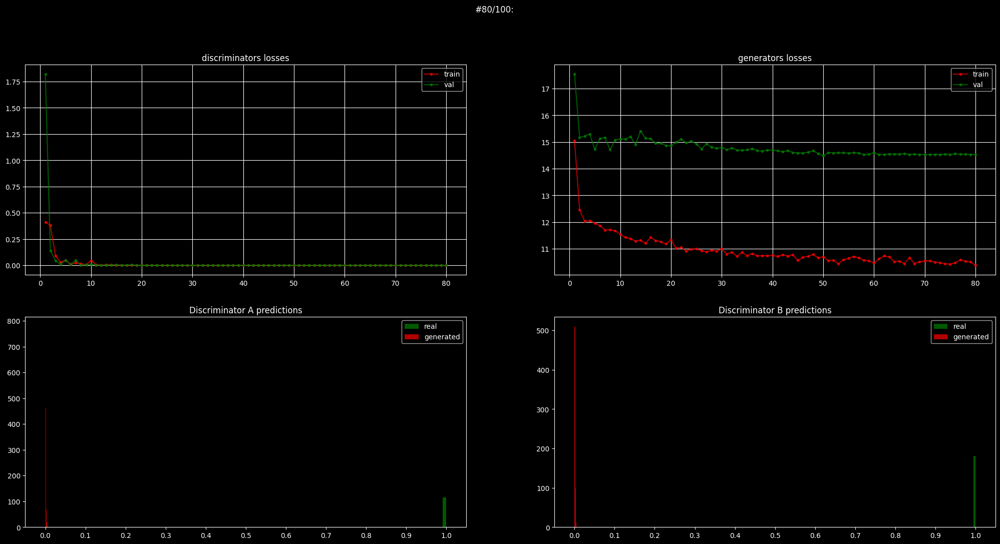

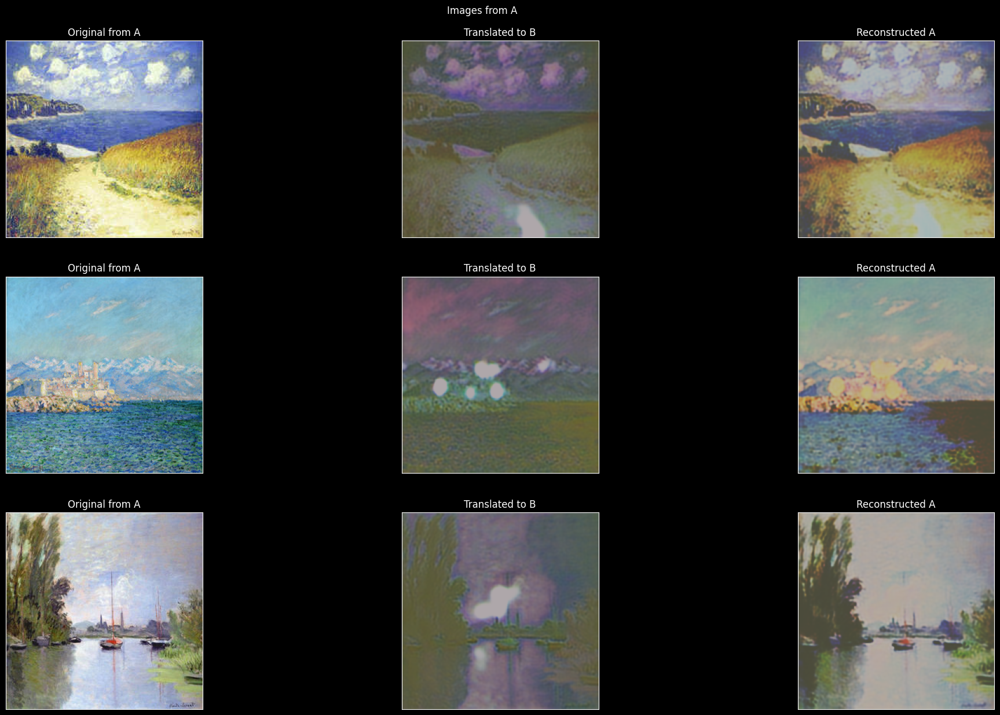

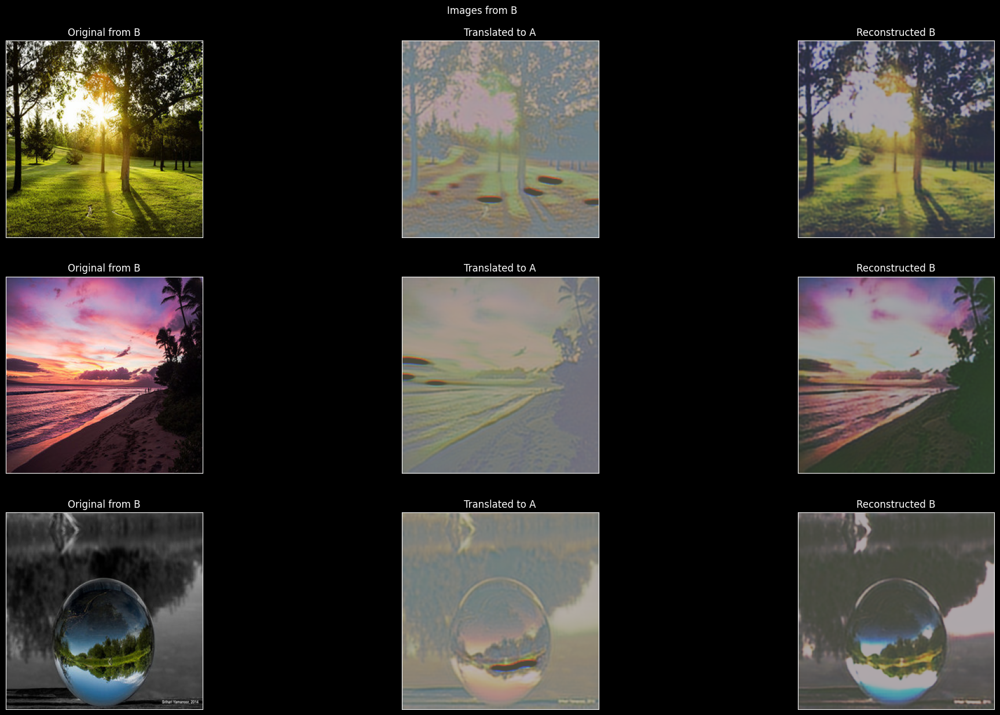

Learning process ended with early stop for discriminator after epoch 80
CPU times: user 2h 29min 34s, sys: 36min 37s, total: 3h 6min 12s
Wall time: 3h 10min 56s


In [149]:
%%time
model, optimizer_d, optimizer_g, plots = learning_loop(
    model = model,
    optimizer_g = optimizer_g,
    g_iters_per_epoch = 1,
    optimizer_d = optimizer_d,
    d_iters_per_epoch = 1,
    train_loader_a = dataloaders.train_a,
    train_loader_b = dataloaders.train_b,
    val_loader_a = dataloaders.test_a,
    val_loader_b = dataloaders.test_b,
    criterion_d = criterion_d,
    criterion_g = criterion_g,
    scheduler_g = scheduler_g,
    scheduler_d = scheduler_d,
    de_norm_a = de_normalize_a,
    de_norm_b = de_normalize_b,
    epochs = 100,
    min_lr = 1e-6,
    val_every = 1,
    draw_every = 1,
    chkp_folder = "./chkp",
    model_name = "cycle_gan",
    images_per_validation=3,
    plots=None,
    starting_epoch=0,
)

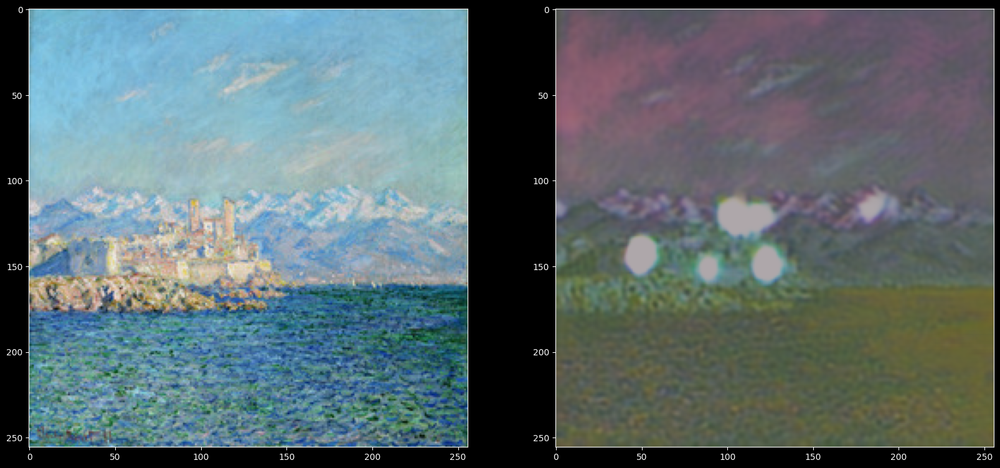

In [150]:
img_a = ds.test_a[1].to(device).unsqueeze(0)

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_a(img_a[0].detach().cpu()))

plt.subplot(122)
plt.imshow(de_normalize_b(model.generator_AB(img_a)[0].detach().cpu()))

plt.show()

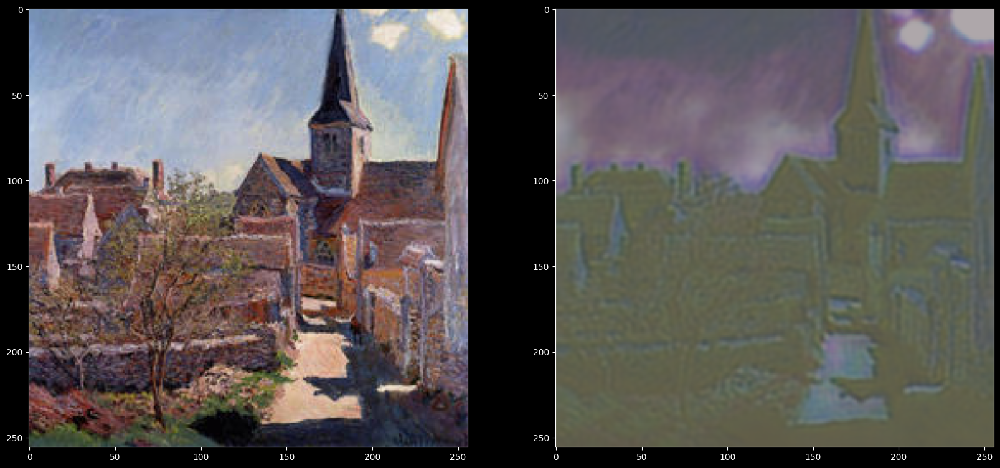

In [151]:
img_a = ds.test_a[5].to(device).unsqueeze(0)

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_a(img_a[0].detach().cpu()))

plt.subplot(122)
plt.imshow(de_normalize_b(model.generator_AB(img_a)[0].detach().cpu()))

plt.show()

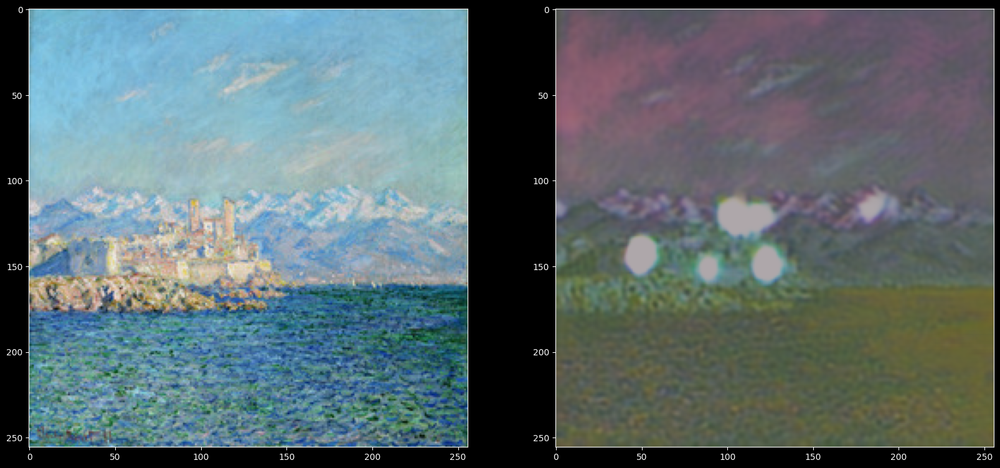

In [152]:
img_a = ds.test_a[1].to(device).unsqueeze(0)
fake_b = model.generator_AB(img_a)[0].detach().cpu()

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_a(img_a[0].detach().cpu()))

plt.subplot(122)
plt.imshow(de_normalize_b(fake_b))

plt.show()

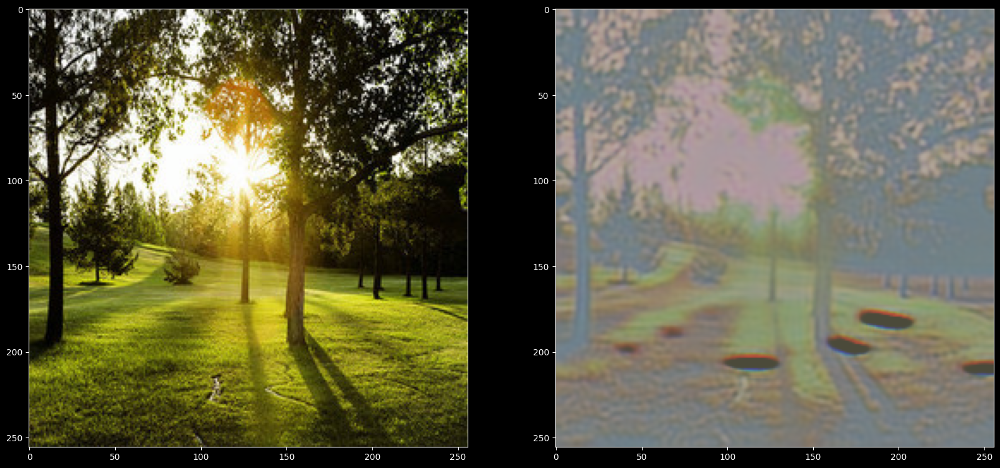

In [153]:
img_b = ds.test_b[0].to(device).unsqueeze(0)
fake_a = model.generator_BA(img_b)[0].detach().cpu()

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_b(img_b[0].detach().cpu()))

plt.subplot(122)
plt.imshow(de_normalize_a(fake_a))

plt.show()

# 5. Свои данные (___3 балла + бонусы___)

В этой части необходимо выполнить следующее:

1. **Создание датасетов**  
   * Соберите один или пару небольших датасета (минимум 100 примеров, но чем больше, тем лучше).  
   * Дайте волю фантазии, но избегайте неадекватного контента, объема данных или данных за рамками норм.  

2. **Обучение CycleGAN**  
   * Обучите модель CycleGAN для преобразования между вашим датасетом (**домен A**) и другим датасетом (**домен B**).  
   * Второй датасет может быть вашим собственным или любым существующим  

3. **Требования к сдаче**  
   * **Архив с датасетами**:  
     Приложите ссылку на заархивированные данные или загрузите сам архив с данными, использованные для обучения.  
   * **Jupyter Notebook**:  
     * Визуализируйте примеры из доменов A и B с кратким описанием идеи (например, "преобразование эскизов в цветные рисунки").  
     * Добавьте код обучения модели (архитектура, гиперпараметры, функция потерь).  
     * Покажите результаты работы модели (минимум по 5 примеров преобразований A→B и B→A).  
   * **Hugging Face Space + Streamlit**:  
     * Разработайте интерактивное приложение с использованием Streamlit, которое позволяет:  
       - Загружать изображения из доменов A и B.  
       - Отображать результаты преобразований (A→B и B→A) в реальном времени.  
     * Выложите приложение в Hugging Face Space и приложите ссылку на него.  
     * Убедитесь, что модель интегрирована в приложение, а проверяющие могут самостоятельно тестировать её через интерфейс.  

4. **Критерии оценки**  
   * Дополнительные баллы начисляются за:  
     - Креативные и качественные датасеты.  
     - Высокое качество преобразований (четкость, сохранение структуры, отсутствие артефактов).  
     - Удобный и наглядный интерфейс Streamlit-приложения.  

**Примеры идей для датасетов**:  
- Эскизы → Реалистичные изображения.  
- Дневные фото → Ночные фото.  
- Картины в стиле импрессионизма → фотореализм.  

**Важно**:  
- Проверяющий будет оценивать работу через ваше Streamlit-приложение. Убедитесь, что инференс работает стабильно.  
- Если модель слишком велика для деплоя, используйте оптимизацию.  

___Удачи!___ 🚀